<a href="https://colab.research.google.com/github/hayTambourineMan/BMED_6460_GroupProject_PENGWIN/blob/main/SAM2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Load training set and set up dependencies

In [1]:
from google.colab import drive
drive.mount('/content/drive')+

Mounted at /content/drive


In [2]:
import zipfile
import os

dataset_path = '/content/drive/MyDrive/dataset.zip'

output_dir = '/content/data'

# Unzip the dataset
with zipfile.ZipFile(dataset_path, 'r') as zip_ref:
    zip_ref.extractall(output_dir)

print("Dataset extracted to:", output_dir)

Dataset extracted to: /content/data


In [3]:
!git clone https://github.com/facebookresearch/sam2.git

Cloning into 'sam2'...
remote: Enumerating objects: 1070, done.
remote: Counting objects: 100% (477/477), done.
remote: Compressing objects: 100% (198/198), done.
remote: Total 1070 (delta 322), reused 279 (delta 279), pack-reused 593 (from 1)
Receiving objects: 100% (1070/1070), 115.76 MiB | 35.12 MiB/s, done.
Resolving deltas: 100% (416/416), done.


In [4]:
!wget -O /content/sam2/sam2/configs/train.yaml 'https://drive.usercontent.google.com/download?id=11cmbxPPsYqFyWq87tmLgBAQ6OZgEhPG3'

--2025-04-09 13:20:36--  https://drive.usercontent.google.com/download?id=11cmbxPPsYqFyWq87tmLgBAQ6OZgEhPG3
Resolving drive.usercontent.google.com (drive.usercontent.google.com)... 172.217.214.132, 2607:f8b0:4001:c05::84
Connecting to drive.usercontent.google.com (drive.usercontent.google.com)|172.217.214.132|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 11055 (11K) [application/octet-stream]
Saving to: ‘/content/sam2/sam2/configs/train.yaml’

/content/sam2/sam2/ 100%[===================>]  10.80K  --.-KB/s    in 0s      

2025-04-09 13:20:38 (91.1 MB/s) - ‘/content/sam2/sam2/configs/train.yaml’ saved [11055/11055]



In [5]:
%cd ./sam2/

/content/sam2


In [6]:
!pip install -e .[dev] -q

  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 1.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.6/74.6 kB 3.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 4.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 8.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 38.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 13.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.9/74.9 kB 7.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 400.7/400.7 kB 31.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [7]:
!cd ./checkpoints && ./download_ckpts.sh

--2025-04-09 13:25:23--  https://dl.fbaipublicfiles.com/segment_anything_2/092824/sam2.1_hiera_tiny.pt
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 18.238.176.19, 18.238.176.44, 18.238.176.115, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|18.238.176.19|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 156008466 (149M) [application/vnd.snesdev-page-table]
Saving to: ‘sam2.1_hiera_tiny.pt’

sam2.1_hiera_tiny.p 100%[===================>] 148.78M   145MB/s    in 1.0s    

2025-04-09 13:25:24 (145 MB/s) - ‘sam2.1_hiera_tiny.pt’ saved [156008466/156008466]

--2025-04-09 13:25:24--  https://dl.fbaipublicfiles.com/segment_anything_2/092824/sam2.1_hiera_small.pt
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 18.238.176.19, 18.238.176.44, 18.238.176.115, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|18.238.176.19|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 184416285 (176M)

# need to change to their file structure & annotation style

In [ ]:
# import os
# import json
# import numpy as np
# import cv2
# from pathlib import Path
# from pycocotools import mask as mask_utils
# from tqdm import tqdm

# IMAGE_FOLDER = "/content/data/sam_dataset/images/train"
# MASK_FOLDER = "/content/data/sam_dataset/masks/train"

# # Fix folder structure and generate JSON annotations per image
# mask_dirs = sorted(os.listdir(MASK_FOLDER))

# for mask_dir in tqdm(mask_dirs, desc="Generating JSON masks"):
#     mask_subdir_path = os.path.join(MASK_FOLDER, mask_dir)

#     # Initialize the JSON content for this image
#     mask_json = {"annotations": []}

#     mask_files = [f for f in os.listdir(mask_subdir_path) if f.endswith('.png')]

#     ann_id = 1
#     for mask_filename in mask_files:
#         # Load mask image
#         mask_path = os.path.join(mask_subdir_path, mask_filename)
#         mask_img = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
#         binary_mask = (mask_img > 128).astype(np.uint8)

#         # Encode mask as COCO RLE
#         rle = mask_utils.encode(np.asfortranarray(binary_mask))
#         rle['counts'] = rle['counts'].decode('utf-8')
#         area = float(mask_utils.area(rle))
#         bbox = mask_utils.toBbox(rle).tolist()

#         # Extract class info from filename
#         label = Path(mask_filename).stem  # e.g., "SA-1"
#         category, fragment = label.split('-')
#         category_id = ({"SA": 0, "LI": 1, "RI": 2}[category]) * 10 + int(fragment)

#         # Append annotation info
#         mask_json["annotations"].append({
#             "id": ann_id,
#             "category_id": category_id,
#             "segmentation": rle,
#             "bbox": bbox,
#             "area": area,
#             "iscrowd": 0
#         })

#         ann_id += 1

#     # Save to JSON file in MASK_FOLDER
#     json_filename = f"{mask_dir}.json"
#     json_path = os.path.join(MASK_FOLDER, json_filename)
#     with open(json_path, 'w') as jf:
#         json.dump(mask_json, jf)

# print("JSON mask annotation files generated successfully.")

Generating JSON masks: 100%|██████████| 7999/7999 [04:50<00:00, 27.56it/s]

JSON mask annotation files generated successfully.


# training

In [8]:
!python training/train.py -c 'configs/train.yaml' --use-cluster 0 --num-gpus 1

Streaming output truncated to the last 5000 lines.
INFO 2025-04-09 18:17:40,695 train_utils.py: 271: Train Epoch: [9][1220/5000] | Batch Time: 0.37 (0.38) | Data Time: 0.00 (0.01) | Mem (GB): 10.00 (9.31/11.00) | Time Elapsed: 00d 04h 51m | Losses/train_all_loss: 1.03e+00 (1.65e+00)
INFO 2025-04-09 18:17:44,395 train_utils.py: 271: Train Epoch: [9][1230/5000] | Batch Time: 0.36 (0.38) | Data Time: 0.00 (0.01) | Mem (GB): 9.00 (9.31/11.00) | Time Elapsed: 00d 04h 51m | Losses/train_all_loss: 7.55e-01 (1.65e+00)
INFO 2025-04-09 18:17:48,111 train_utils.py: 271: Train Epoch: [9][1240/5000] | Batch Time: 0.38 (0.38) | Data Time: 0.00 (0.01) | Mem (GB): 11.00 (9.31/11.00) | Time Elapsed: 00d 04h 51m | Losses/train_all_loss: 7.26e-01 (1.65e+00)
INFO 2025-04-09 18:17:51,811 train_utils.py: 271: Train Epoch: [9][1250/5000] | Batch Time: 0.37 (0.38) | Data Time: 0.00 (0.01) | Mem (GB): 9.00 (9.31/11.00) | Time Elapsed: 00d 04h 51m | Losses/train_all_loss: 2.23e+00 (1.65e+00)
INFO 2025-04-09 18:

# moment of truth

# run inference

In [11]:
!pip install supervision -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 181.5/181.5 kB 5.2 MB/s eta 0:00:00


In [13]:
import torch
from sam2.build_sam import build_sam2
from sam2.automatic_mask_generator import SAM2AutomaticMaskGenerator
import supervision as sv
import os
import random
from PIL import Image
import numpy as np

torch.autocast("cuda", dtype=torch.bfloat16).__enter__()
if torch.cuda.get_device_properties(0).major >= 8:
    torch.backends.cuda.matmul.allow_tf32 = True
    torch.backends.cudnn.allow_tf32 = True

checkpoint = "/content/sam2/sam2_logs/configs/train.yaml/checkpoints/checkpoint.pt"
model_cfg = "configs/sam2.1/sam2.1_hiera_b+.yaml"
sam2 = build_sam2(model_cfg, checkpoint, device="cuda")
mask_generator = SAM2AutomaticMaskGenerator(sam2)

checkpoint_base = "/content/sam2/checkpoints/sam2.1_hiera_base_plus.pt"
model_cfg_base = "configs/sam2.1/sam2.1_hiera_b+.yaml"
sam2_base = build_sam2(model_cfg_base, checkpoint_base, device="cuda")
mask_generator_base = SAM2AutomaticMaskGenerator(sam2_base)

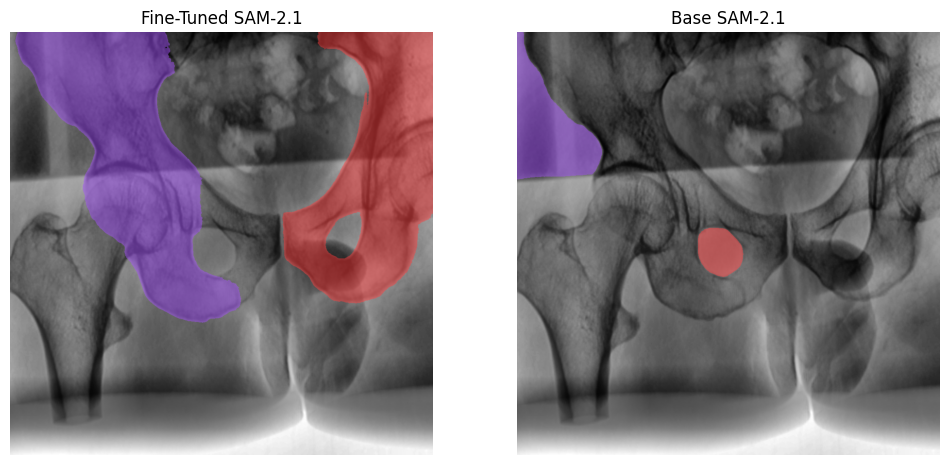

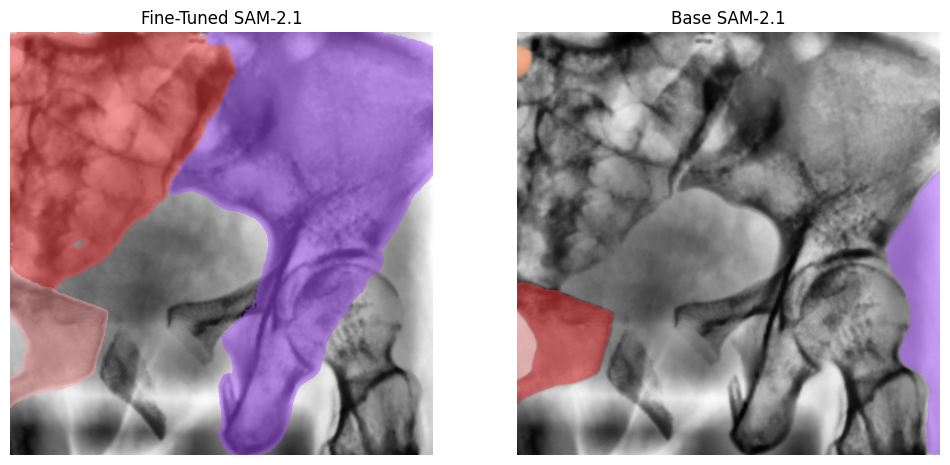

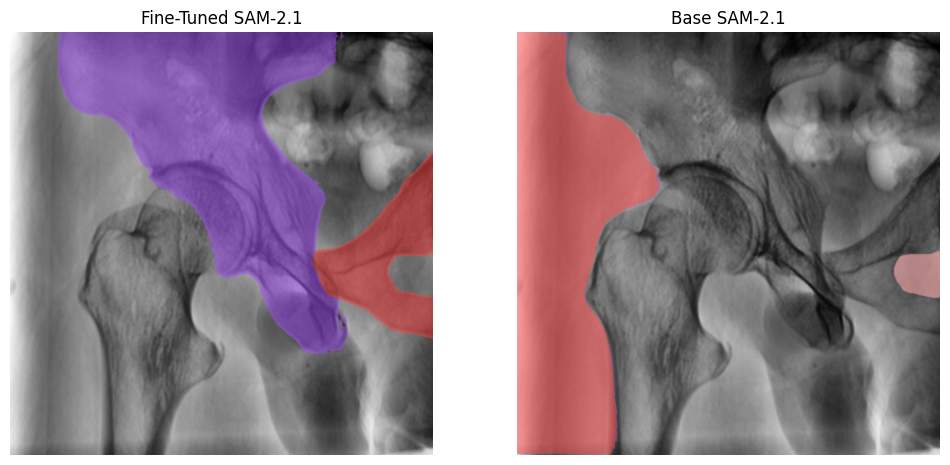

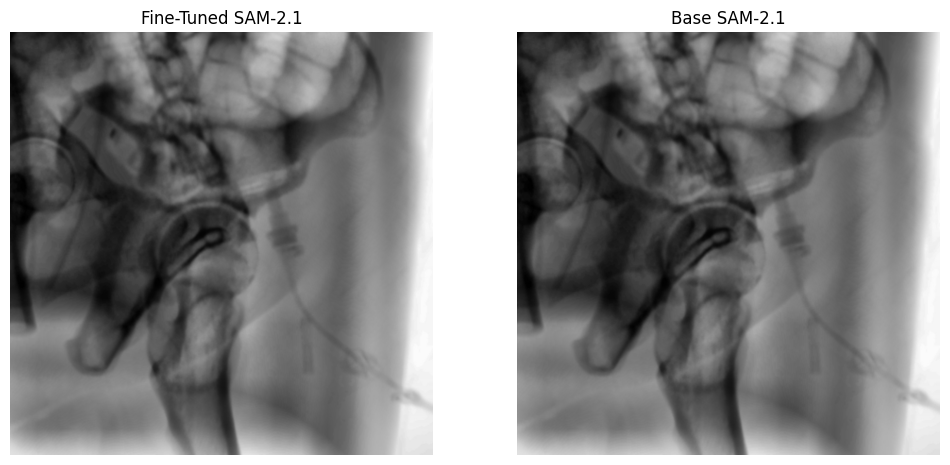

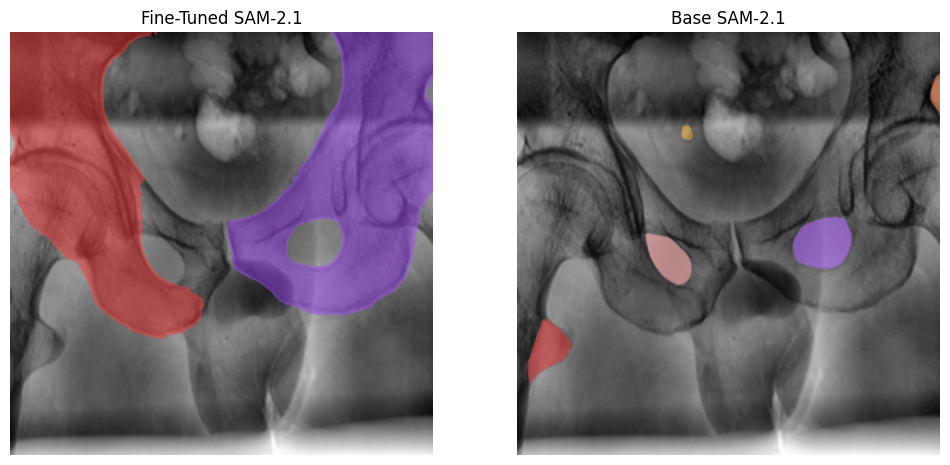

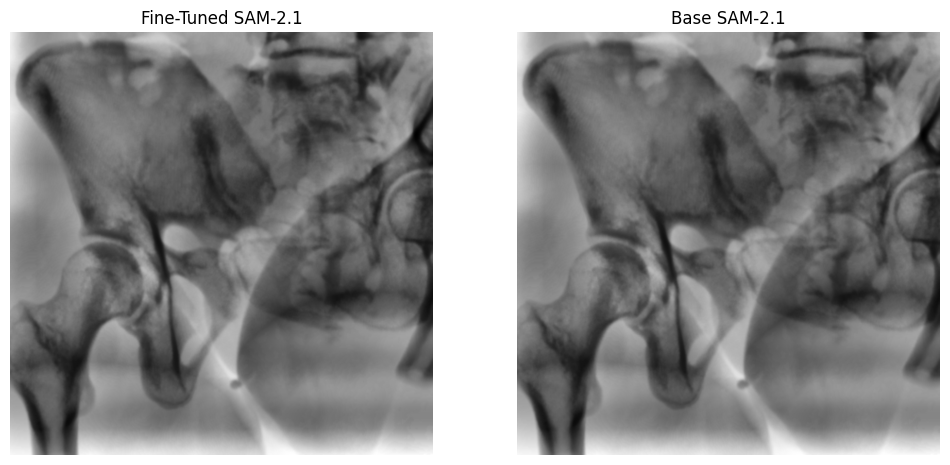

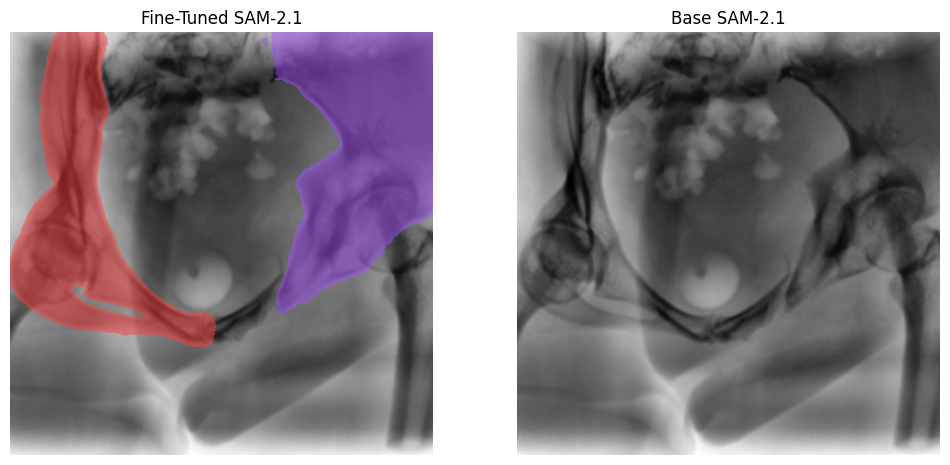

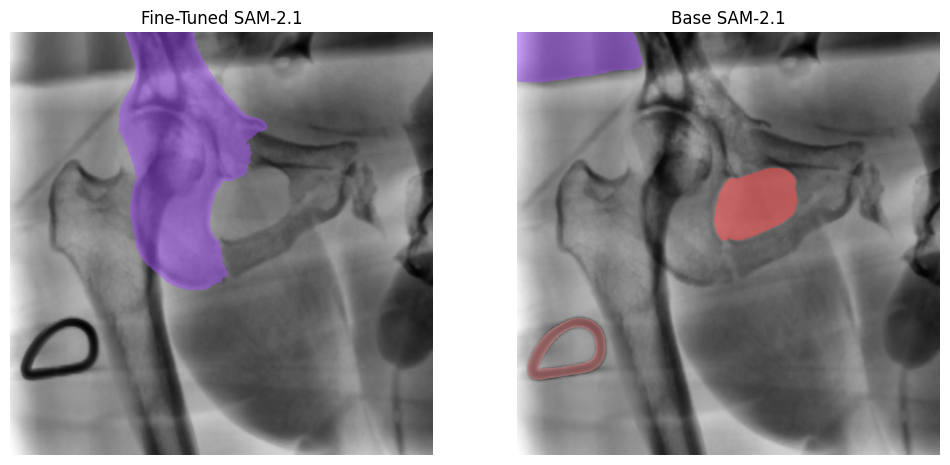

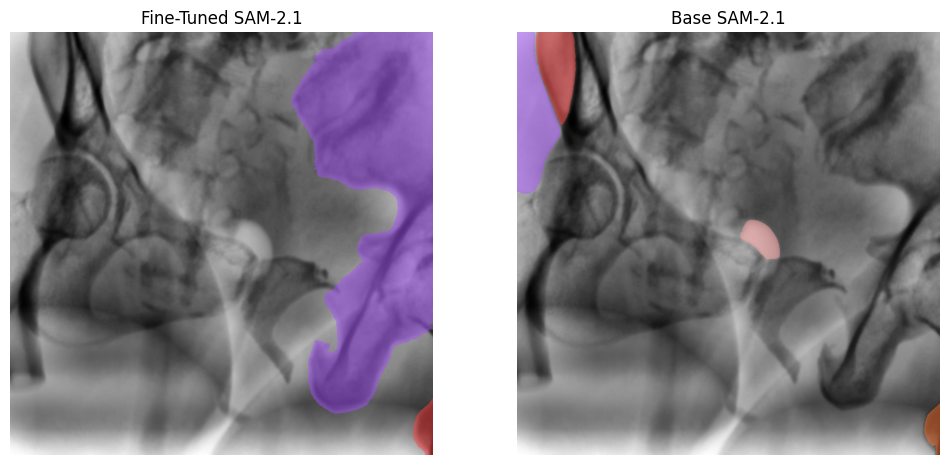

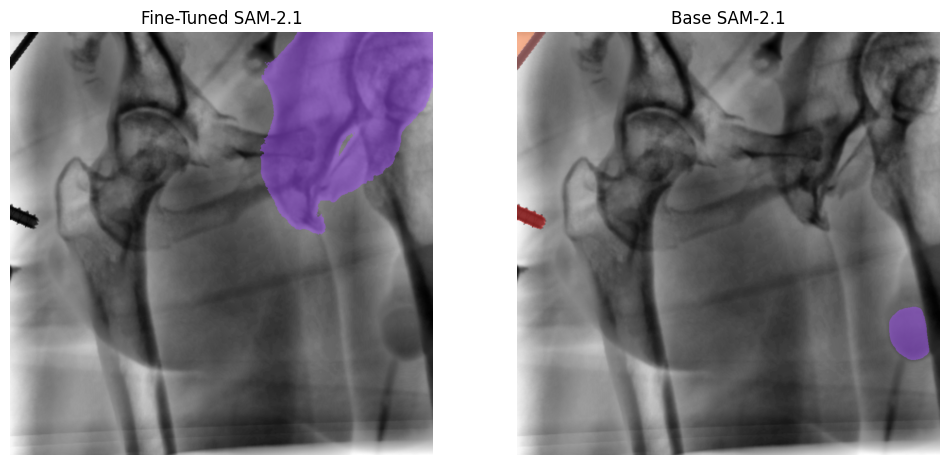

In [14]:
import os
import random
import numpy as np
from PIL import Image
import supervision as sv

# Path to original training set images
train_dir = "/content/data/sam_dataset/images/train"

# Select 10 random images from the training set
all_train_images = [img for img in os.listdir(train_dir) if img.endswith(".jpg")]
selected_images = random.sample(all_train_images, 10)

for img_name in selected_images:
    image_path = os.path.join(train_dir, img_name)
    opened_image = np.array(Image.open(image_path).convert("RGB"))

    # Generate mask predictions using fine-tuned SAM
    result = mask_generator.generate(opened_image)
    detections = sv.Detections.from_sam(sam_result=result)

    mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)
    annotated_image = opened_image.copy()
    annotated_image = mask_annotator.annotate(annotated_image, detections=detections)

    # Generate mask predictions using base SAM
    base_result = mask_generator_base.generate(opened_image)
    base_detections = sv.Detections.from_sam(sam_result=base_result)

    base_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)
    base_annotated_image = opened_image.copy()
    base_annotated_image = base_annotator.annotate(base_annotated_image, detections=base_detections)

    # Plot the comparison images
    sv.plot_images_grid(
        images=[annotated_image, base_annotated_image],
        titles=["Fine-Tuned SAM-2.1", "Base SAM-2.1"],
        grid_size=(1, 2)
    )

In [15]:
!zip -r /content/sam2_logs.zip /content/sam2/sam2_logs

  adding: content/sam2/sam2_logs/ (stored 0%)
  adding: content/sam2/sam2_logs/configs/ (stored 0%)
  adding: content/sam2/sam2_logs/configs/train.yaml/ (stored 0%)
  adding: content/sam2/sam2_logs/configs/train.yaml/config.yaml (deflated 72%)
  adding: content/sam2/sam2_logs/configs/train.yaml/config_resolved.yaml (deflated 74%)
  adding: content/sam2/sam2_logs/configs/train.yaml/checkpoints/ (stored 0%)
  adding: content/sam2/sam2_logs/configs/train.yaml/checkpoints/checkpoint.pt (deflated 8%)
  adding: content/sam2/sam2_logs/configs/train.yaml/tensorboard/ (stored 0%)
  adding: content/sam2/sam2_logs/configs/train.yaml/tensorboard/events.out.tfevents.1744205175.ab53c1d7c213.3004.05e3fa5e1-bc67-4230-9175-e642decfa2aa (deflated 82%)
  adding: content/sam2/sam2_logs/configs/train.yaml/logs/ (stored 0%)
  adding: content/sam2/sam2_logs/configs/train.yaml/logs/log.txt (deflated 92%)
  adding: content/sam2/sam2_logs/configs/train.yaml/logs/best_stats.json (deflated 84%)
  adding: content/

In [16]:
%load_ext tensorboard
%tensorboard --bind_all --logdir ./sam2_logs/

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

# evaluation

In [19]:
import os
import json
import numpy as np
from PIL import Image, ImageDraw
from tqdm import tqdm
import torch
import pycocotools.mask as mask_utils
from sam2.build_sam import build_sam2
from sam2.automatic_mask_generator import SAM2AutomaticMaskGenerator
from scipy.spatial.distance import cdist
from sklearn.utils import resample

# === Setup
image_dir = "/content/data/sam_dataset/images/train"
mask_dir = "/content/data/sam_dataset/masks/train"
checkpoint = "/content/sam2/sam2_logs/configs/train.yaml/checkpoints/checkpoint.pt"
model_cfg = "configs/sam2.1/sam2.1_hiera_b+.yaml"

# === Build model
device = "cuda" if torch.cuda.is_available() else "cpu"
sam2 = build_sam2(model_cfg, checkpoint, device=device)
mask_generator = SAM2AutomaticMaskGenerator(sam2)

# === Utility Functions
def decode_ground_truth(json_path, shape=(1024, 1024)):
    with open(json_path, "r") as f:
        gt = json.load(f)

    masks = []
    anatomy_ids = []
    for ann in gt['annotations']:
        rle = ann['segmentation']  # Already contains 'size' and 'counts'
        binary_mask = mask_utils.decode(rle)
        if binary_mask.ndim == 3:
            binary_mask = binary_mask[:, :, 0]
        masks.append(binary_mask)
        anatomy_ids.append(ann["category_id"] // 10)  # Convert 1–30 → 0–2
    return masks, anatomy_ids

def merge_by_anatomy(masks, anatomy_ids, shape=(1024, 1024)):
    merged = np.zeros((3, *shape), dtype=np.uint8)
    for i, a_id in enumerate(anatomy_ids):
        if a_id in [1, 2, 3]:
            merged[a_id - 1] |= masks[i]
    return merged

def extract_surface_points(mask, max_points=5000):
    from scipy.ndimage import binary_dilation, binary_erosion, generate_binary_structure
    struct = generate_binary_structure(2, 1)
    eroded = binary_erosion(mask, structure=struct)
    edge = binary_dilation(mask, structure=struct) & ~eroded
    coords = np.argwhere(edge)
    if len(coords) > max_points:
        coords = resample(coords, n_samples=max_points, random_state=42)
    return coords

def iou(mask1, mask2):
    inter = np.logical_and(mask1, mask2).sum()
    union = np.logical_or(mask1, mask2).sum()
    return inter / union if union > 0 else 0

def hd95(p1, p2):
    if len(p1) == 0 or len(p2) == 0:
        return np.inf
    d = cdist(p1, p2)
    return max(np.percentile(np.min(d, axis=1), 95),
               np.percentile(np.min(d, axis=0), 95))

def assd(p1, p2):
    if len(p1) == 0 or len(p2) == 0:
        return np.inf
    d = cdist(p1, p2)
    return (np.mean(np.min(d, axis=1)) + np.mean(np.min(d, axis=0))) / 2

def radius_fallback(mask):
    points = np.argwhere(mask)
    if points.shape[0] == 0:
        return np.inf
    center = points.mean(axis=0)
    return np.max(np.linalg.norm(points - center, axis=1))

# === Evaluation
metrics = {
    "fracture_iou": 0.0,
    "fracture_hd95": 0.0,
    "fracture_assd": 0.0,
    "anatomical_iou": 0.0,
    "anatomical_hd95": 0.0,
    "anatomical_assd": 0.0,
}
count_fracture = 0
count_anatomy = 0

print("Evaluating SAM2 segmentation on first 100 images...")

image_files = sorted(os.listdir(image_dir))[:100]
for img_file in tqdm(image_files):
    img_path = os.path.join(image_dir, img_file)
    json_path = os.path.join(mask_dir, img_file.replace(".jpg", ".json").replace(".png", ".json"))

    image = np.array(Image.open(img_path).convert("RGB"))
    gt_masks, anatomy_ids = decode_ground_truth(json_path, shape=image.shape[:2])
    gt_stack = np.array(gt_masks)
    gt_merged = merge_by_anatomy(gt_stack, anatomy_ids, shape=image.shape[:2])

    pred = mask_generator.generate(image)
    pred_stack = np.zeros((30, *image.shape[:2]), dtype=np.uint8)
    for i, ann in enumerate(pred[:30]):
        seg = ann['segmentation']
        if seg.shape[:2] != image.shape[:2]:
            seg = np.array(Image.fromarray(seg).resize(image.shape[:2][::-1], resample=Image.NEAREST))
        pred_stack[i] = seg.astype(np.uint8)

    pred_merged = np.zeros((3, *image.shape[:2]), dtype=np.uint8)
    for i in range(30):
        cat = i // 10
        pred_merged[cat] |= pred_stack[i]

    # === Fracture
    for i in range(len(gt_stack)):
        gt = gt_stack[i]
        best_iou = 0
        best_pred = None
        for j in range(pred_stack.shape[0]):
            candidate = pred_stack[j]
            iou_score = iou(gt, candidate)
            if iou_score > best_iou:
                best_iou = iou_score
                best_pred = candidate

        if best_iou > 0:
            p1 = extract_surface_points(gt)
            p2 = extract_surface_points(best_pred)
            metrics["fracture_iou"] += best_iou
            metrics["fracture_hd95"] += hd95(p1, p2)
            metrics["fracture_assd"] += assd(p1, p2)
        else:
            r = radius_fallback(gt)
            metrics["fracture_hd95"] += 2 * r
            metrics["fracture_assd"] += r
        count_fracture += 1

    # === Anatomical
    for a in range(3):
        g = gt_merged[a]
        p = pred_merged[a]
        iou_score = iou(g, p)
        if iou_score > 0:
            p1 = extract_surface_points(g)
            p2 = extract_surface_points(p)
            metrics["anatomical_iou"] += iou_score
            metrics["anatomical_hd95"] += hd95(p1, p2)
            metrics["anatomical_assd"] += assd(p1, p2)
        else:
            r = radius_fallback(g)
            metrics["anatomical_hd95"] += 2 * r
            metrics["anatomical_assd"] += r
        count_anatomy += 1

# === Results
print("\n--- SAM2 Evaluation Results (avg over 100 images) ---")
print(f"  fracture_iou: {metrics['fracture_iou'] / count_fracture:.4f}")
print(f"  fracture_hd95: {metrics['fracture_hd95'] / count_fracture:.4f}")
print(f"  fracture_assd: {metrics['fracture_assd'] / count_fracture:.4f}")
print(f"  anatomical_iou: {metrics['anatomical_iou'] / count_anatomy:.4f}")
print(f"  anatomical_hd95: {metrics['anatomical_hd95'] / count_anatomy:.4f}")
print(f"  anatomical_assd: {metrics['anatomical_assd'] / count_anatomy:.4f}")

Evaluating SAM2 segmentation on first 100 images...


100%|██████████| 100/100 [02:54<00:00,  1.74s/it]


--- SAM2 Evaluation Results (avg over 100 images) ---
  fracture_iou: 0.4089
  fracture_hd95: 335.0547
  fracture_assd: 134.9106
  anatomical_iou: 0.1351
  anatomical_hd95: inf
  anatomical_assd: inf


100%|██████████| 20/20 [00:14<00:00,  1.36it/s]


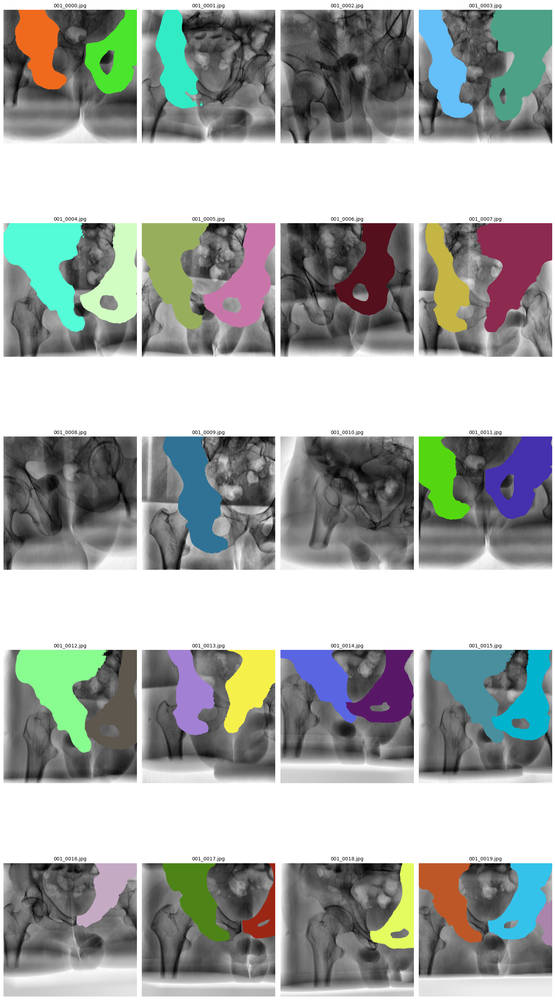

In [20]:
import os
import json
import numpy as np
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt
from tqdm import tqdm

import torch
from sam2.build_sam import build_sam2
from sam2.automatic_mask_generator import SAM2AutomaticMaskGenerator

# === Set up device and model ===
checkpoint = "/content/sam2/sam2_logs/configs/train.yaml/checkpoints/checkpoint.pt"
model_cfg = "configs/sam2.1/sam2.1_hiera_b+.yaml"
sam2 = build_sam2(model_cfg, checkpoint, device="cuda")
mask_generator = SAM2AutomaticMaskGenerator(sam2)

# === Paths ===
IMG_DIR = "/content/data/sam_dataset/images/train"
N = 20  # number of images
image_paths = sorted([os.path.join(IMG_DIR, f) for f in os.listdir(IMG_DIR) if f.endswith(".jpg")])[:N]

# === Visualization ===
def overlay_masks(image, masks):
    overlay = image.copy()
    for m in masks:
        mask = m["segmentation"]
        color = tuple(np.random.randint(0, 255, 3).tolist())
        mask_img = Image.fromarray((mask * 255).astype(np.uint8)).convert("L")
        color_layer = Image.new("RGB", image.size, color)
        overlay.paste(color_layer, (0, 0), mask_img)
    return overlay

def visualize_predictions():
    plt.figure(figsize=(16, 32))
    for idx, image_path in enumerate(tqdm(image_paths)):
        image = Image.open(image_path).convert("RGB")
        image_np = np.array(image)
        result = mask_generator.generate(image_np)
        overlayed = overlay_masks(image, result)

        plt.subplot(5, 4, idx + 1)
        plt.imshow(overlayed)
        plt.axis('off')
        plt.title(os.path.basename(image_path), fontsize=10)
    plt.tight_layout()
    plt.show()

visualize_predictions()